In [1]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats

#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

dataframe (Dataframe) - contains CMIP6 intake json 

In [2]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [4]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'

In [5]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [6]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


### Empirical data

In [7]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(parent_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [8]:
Landuse_all = xr.open_dataset(parent_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

#### Defining functions

In [9]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

In [10]:
#Funtion to calulate days per month as a constant funtion (needs to be multiplied to CMIP6-precipitation estimates)
def sum_of_day(year_start, year_end, lat_1, lon_2):
    sum_of_day = []
    year = 0
    for year in range(year_start,year_end+1):
        for month in range(1,13):
            sum_of_day.append(monthrange(year, month)[1]*(np.ones((lat_1, lon_2)))*86400)
    sum_of_day = (np.array(sum_of_day))
    return sum_of_day

In [11]:
def calc_Seasonality(data):
    # Input is monthly data of precipitation
    Seasonality = []
    for lat in range(data.shape[1]):
        for lon in range(data.shape[2]):
            Seasonality.append(((1/data[:,lat,lon].sum())*(np.array([abs((data[i,lat,lon]-(data[:,lat,lon].sum()/12))) for i in range(12)]).sum())))
    Seasonality = (np.array(Seasonality).reshape(data.shape[1],data.shape[2]))
    return Seasonality

In [12]:
def interp_selfilter(file, Landuse,lat_min,lat_max,lon_min,lon_max):
    if isinstance(file,(np.ndarray)):
        file = xr.DataArray(file, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit"))
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    else:
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    return file

In [13]:
def boxplot_custom(order, data, ax=None, **kwargs):
    ax = ax or plt.gca()
    data = remove_outliers(data, data.columns[0])
    ax.plot([data.quantile(0.25)[0], data.quantile(0.75)[0]], [order, order], **kwargs, lw = 2.5, color = 'black', zorder=1)
    ax.plot([data.quantile(0.025)[0], data.quantile(0.975)[0]], [order, order], **kwargs, lw = 1, color = 'black', zorder=0)
    #ax.plot([(data.quantile(0.25)[0]-1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0])), 
    #        (data.quantile(0.75)[0]+1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0]))], [0,0], **kwargs, lw = 1, color = 'black', zorder=0) 
    ax.scatter(data.median(), order, **kwargs, s = 150, edgecolors = 'black', lw = 2.5, facecolor = '#8c6bb1', zorder=2);
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.get_yaxis().set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    return data.quantile(0.025)[0], data.quantile(0.25)[0], data.quantile(0.75)[0], data.quantile(0.975)[0];

In [14]:
def forest_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_sel = Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
            #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
            pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                       pd.DataFrame({'Landuse': Landuse_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                       pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()

    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    """
    df_full = pd.DataFrame({'Precip_yearly': (dataframe.filter(like='Precip').dropna()).sum(axis = 1), 
              'Seasonality': seasonality})
    """
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    sz = dataframe['Precip'].size-1
    dataframe['Precip_percentile'] = dataframe['Precip'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    dataframe['Seasonality_percentile'] = dataframe['Seasonality'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)
    dataframe = dataframe[['Sr','Precip','Seasonality','Precip_percentile','Seasonality_percentile']]
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [15]:
def savanna_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_only_savanna_sel = Landuse_only_savanna.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
        #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
        pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                   pd.DataFrame({'Landuse': Landuse_only_savanna_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                   pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()
    
    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    dataframe = dataframe[['Sr','Precip','Seasonality']]
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [16]:
def combined_classification_all_WSf_future(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 4) | (B == 7))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2) | (B == 5) | (B == 8))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3) | (B == 6) | (B == 9))
        if 'Tipping' == Forest_class:
            C = B.where((B == 11) | (B == 12) | (B == 13))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [17]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [18]:
def barchart_area_classes(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']
    
    a,b,c = area
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="\\\\", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [19]:
def barchart_area_classes_custom(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3,lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [20]:
def Forest_savanna_transition(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_975_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_975_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    return CMIP6_class_array_corrected

In [21]:
def Forest_savanna_transition_low_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

In [22]:
def Forest_savanna_transition_high_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= sav_Prec_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_25_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= sav_Prec_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_25_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

#### Running analysis

In [23]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'
Sr_lower_threshold = 100
Sr_upper_threshold = 400

South America (Total Area) = 8216635.38904723 km^2

In [24]:
df_final = pd.read_csv(parent_dir+'CMIP6-Future_models_all_(with Sr-eq)_South America.csv')

In [25]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,116.575532,409.900705
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,95.728133,314.000824
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,127.053403,446.708181
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,93.549910,348.750239
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,120.418121,336.189765
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,164.953056,445.445854
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,155.168020,288.220768
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,147.600075,282.739693
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,194.054560,337.462342
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,165.402306,338.410103


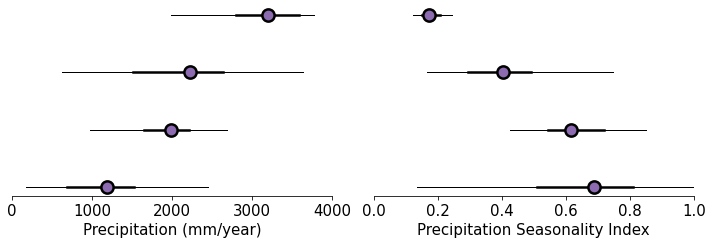

In [26]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(lat_min,lat_max,lon_min,lon_max)
dataframe_sav = savanna_dataframe(lat_min,lat_max,lon_min,lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > Sr_lower_threshold) & (dataframe_forest['Sr'] < Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,1)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

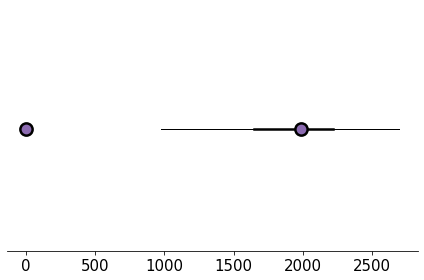

In [27]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))

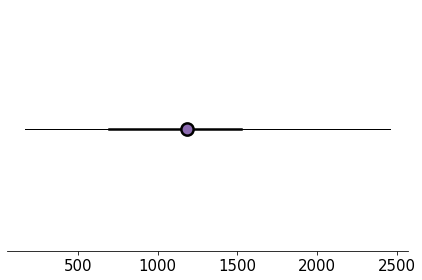

In [28]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [29]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [30]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [31]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

------------

In [33]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))

        for class_number in range(1,10):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:03<00:00,  9.47it/s]


In [ ]:
#Interesting trends-4,5,15,22

SA_CMIP6_class_all_forest_savanna_corrected = {}
SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,lat_min, lat_max, lon_min, lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        
        b = 0
        b = (Forest_savanna_transition_low_sensitivity(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[SSP+'.'+str(a_temp.iloc[i,1])] = b

        c = 0
        c = (Forest_savanna_transition_high_sensitivity(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[SSP+'.'+str(a_temp.iloc[i,1])] = c
        
        future_year_end = 2100

In [34]:
#Change the folder name to 'historical vs future' or 'empirical vs future' depending on the simulation

In [57]:
save_folder = 'SA_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [58]:
#Saving Sr under different scenarios
common_dir = ['Saved_NetCDF/'+save_folder]
for dir2 in common_dir:
    try: os.makedirs(os.path.join(parent_dir,dir2))
    except OSError: pass

In [59]:
for name in tqdm(SA_CMIP6_class_all_forest_savanna_corrected.keys()):
    SA_CMIP6_class_all_forest_savanna_corrected[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 205.41it/s]


In [60]:
for name in tqdm(SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity.keys()):
    SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 207.30it/s]


In [61]:
for name in tqdm(SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity.keys()):
    SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 210.57it/s]


In [62]:
SA_CMIP6_class_all_forest_savanna_corrected.keys()
### Copy and save these keys below

dict_keys(['ssp126.ACCESS-CM2', 'ssp126.ACCESS-ESM1-5', 'ssp126.AWI-CM-1-1-MR', 'ssp126.BCC-CSM2-MR', 'ssp126.CAS-ESM2-0', 'ssp126.CESM2-WACCM', 'ssp126.CMCC-CM2-SR5', 'ssp126.CMCC-ESM2', 'ssp126.CanESM5', 'ssp126.EC-Earth3', 'ssp126.EC-Earth3-Veg-LR', 'ssp126.FGOALS-f3-L', 'ssp126.FGOALS-g3', 'ssp126.FIO-ESM-2-0', 'ssp126.GFDL-ESM4', 'ssp126.INM-CM4-8', 'ssp126.INM-CM5-0', 'ssp126.IPSL-CM6A-LR', 'ssp126.KACE-1-0-G', 'ssp126.MIROC6', 'ssp126.MPI-ESM1-2-HR', 'ssp126.MPI-ESM1-2-LR', 'ssp126.MRI-ESM2-0', 'ssp126.NESM3', 'ssp126.NorESM2-LM', 'ssp126.NorESM2-MM', 'ssp126.TaiESM1', 'ssp245.ACCESS-CM2', 'ssp245.AWI-CM-1-1-MR', 'ssp245.BCC-CSM2-MR', 'ssp245.CAS-ESM2-0', 'ssp245.CESM2-WACCM', 'ssp245.CMCC-CM2-SR5', 'ssp245.CMCC-ESM2', 'ssp245.CanESM5', 'ssp245.EC-Earth3', 'ssp245.EC-Earth3-CC', 'ssp245.EC-Earth3-Veg-LR', 'ssp245.FGOALS-f3-L', 'ssp245.FGOALS-g3', 'ssp245.FIO-ESM-2-0', 'ssp245.GFDL-CM4', 'ssp245.GFDL-ESM4', 'ssp245.IITM-ESM', 'ssp245.INM-CM4-8', 'ssp245.INM-CM5-0', 'ssp245.IPSL-C

----

In [64]:
save_folder = 'SA_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [65]:
keys = ['ssp126.ACCESS-CM2', 'ssp126.ACCESS-ESM1-5', 'ssp126.AWI-CM-1-1-MR', 'ssp126.BCC-CSM2-MR', 'ssp126.CAS-ESM2-0', 'ssp126.CESM2-WACCM', 'ssp126.CMCC-CM2-SR5', 'ssp126.CMCC-ESM2', 'ssp126.CanESM5', 'ssp126.EC-Earth3', 'ssp126.EC-Earth3-Veg-LR', 'ssp126.FGOALS-f3-L', 'ssp126.FGOALS-g3', 'ssp126.FIO-ESM-2-0', 'ssp126.GFDL-ESM4', 'ssp126.INM-CM4-8', 'ssp126.INM-CM5-0', 'ssp126.IPSL-CM6A-LR', 'ssp126.KACE-1-0-G', 'ssp126.MIROC6', 'ssp126.MPI-ESM1-2-HR', 'ssp126.MPI-ESM1-2-LR', 'ssp126.MRI-ESM2-0', 'ssp126.NESM3', 'ssp126.NorESM2-LM', 'ssp126.NorESM2-MM', 'ssp126.TaiESM1', 'ssp245.ACCESS-CM2', 'ssp245.AWI-CM-1-1-MR', 'ssp245.BCC-CSM2-MR', 'ssp245.CAS-ESM2-0', 'ssp245.CESM2-WACCM', 'ssp245.CMCC-CM2-SR5', 'ssp245.CMCC-ESM2', 'ssp245.CanESM5', 'ssp245.EC-Earth3', 'ssp245.EC-Earth3-CC', 'ssp245.EC-Earth3-Veg-LR', 'ssp245.FGOALS-f3-L', 'ssp245.FGOALS-g3', 'ssp245.FIO-ESM-2-0', 'ssp245.GFDL-CM4', 'ssp245.GFDL-ESM4', 'ssp245.IITM-ESM', 'ssp245.INM-CM4-8', 'ssp245.INM-CM5-0', 'ssp245.IPSL-CM6A-LR', 'ssp245.KACE-1-0-G', 'ssp245.MIROC6', 'ssp245.MPI-ESM1-2-HR', 'ssp245.MPI-ESM1-2-LR', 'ssp245.MRI-ESM2-0', 'ssp245.NESM3', 'ssp245.NorESM2-LM', 'ssp245.NorESM2-MM', 'ssp245.TaiESM1', 'ssp370.ACCESS-CM2', 'ssp370.AWI-CM-1-1-MR', 'ssp370.BCC-CSM2-MR', 'ssp370.CAS-ESM2-0', 'ssp370.CESM2-WACCM', 'ssp370.CMCC-CM2-SR5', 'ssp370.CMCC-ESM2', 'ssp370.CanESM5', 'ssp370.EC-Earth3', 'ssp370.EC-Earth3-AerChem', 'ssp370.EC-Earth3-Veg-LR', 'ssp370.FGOALS-f3-L', 'ssp370.FGOALS-g3', 'ssp370.GFDL-ESM4', 'ssp370.IITM-ESM', 'ssp370.INM-CM4-8', 'ssp370.INM-CM5-0', 'ssp370.IPSL-CM5A2-INCA', 'ssp370.IPSL-CM6A-LR', 'ssp370.KACE-1-0-G', 'ssp370.MIROC6', 'ssp370.MPI-ESM1-2-HR', 'ssp370.MPI-ESM1-2-LR', 'ssp370.MRI-ESM2-0', 'ssp370.NorESM2-LM', 'ssp370.NorESM2-MM', 'ssp370.TaiESM1', 'ssp585.ACCESS-CM2', 'ssp585.ACCESS-ESM1-5', 'ssp585.AWI-CM-1-1-MR', 'ssp585.BCC-CSM2-MR', 'ssp585.CAS-ESM2-0', 'ssp585.CESM2-WACCM', 'ssp585.CMCC-CM2-SR5', 'ssp585.CMCC-ESM2', 'ssp585.CanESM5', 'ssp585.E3SM-1-1', 'ssp585.EC-Earth3', 'ssp585.EC-Earth3-CC', 'ssp585.EC-Earth3-Veg-LR', 'ssp585.FGOALS-f3-L', 'ssp585.FGOALS-g3', 'ssp585.FIO-ESM-2-0', 'ssp585.GFDL-CM4', 'ssp585.GFDL-ESM4', 'ssp585.IITM-ESM', 'ssp585.INM-CM4-8', 'ssp585.INM-CM5-0', 'ssp585.IPSL-CM6A-LR', 'ssp585.KACE-1-0-G', 'ssp585.MIROC6', 'ssp585.MPI-ESM1-2-HR', 'ssp585.MPI-ESM1-2-LR', 'ssp585.MRI-ESM2-0', 'ssp585.NESM3', 'ssp585.NorESM2-MM', 'ssp585.TaiESM1']

In [66]:
SA_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 250.12it/s]


In [67]:
SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 243.18it/s]


In [68]:
SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 258.88it/s]


In [70]:
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

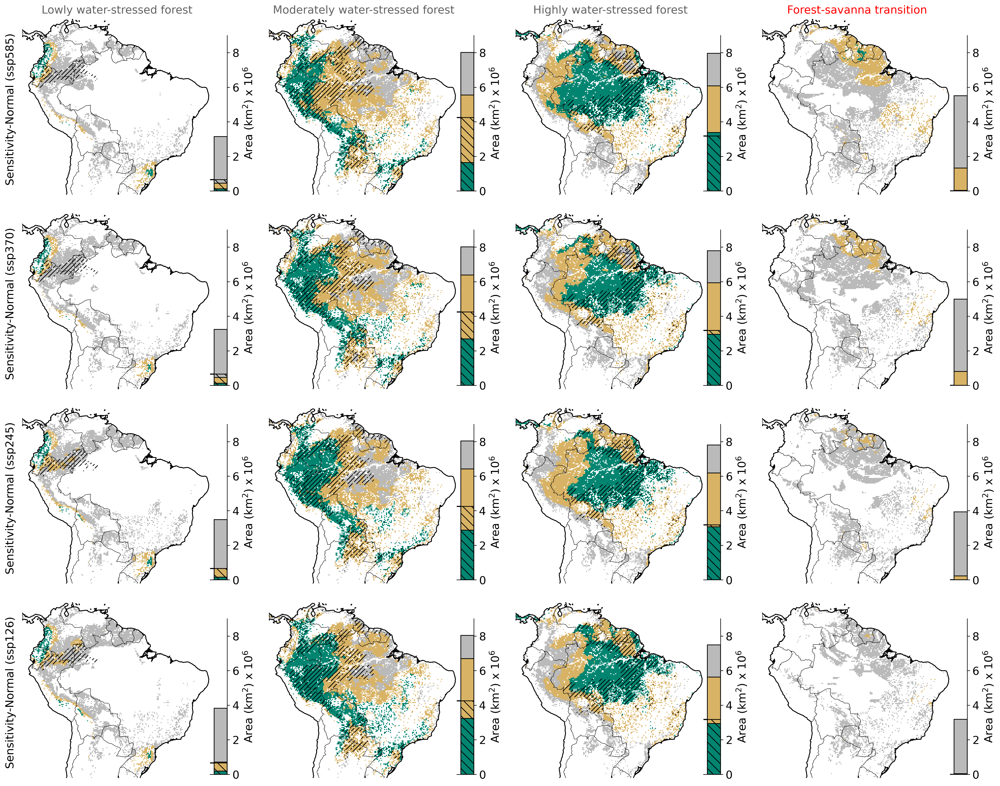

In [71]:
fig = plt.figure(figsize=(22,18), dpi = 300)
ax = [plt.subplot(441,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(442,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(443,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(444,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(445,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(446,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(447,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(448,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(449,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,12,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(4,4,13,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,14,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,15,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,16,projection=ccrs.PlateCarree(), aspect='auto')]

for i in [0,4,8,12]:
    ax[i+0].contourf(Sr_contour.where(Sr <=Sr_lower_threshold).lon.values, Sr_contour.where(Sr <=Sr_lower_threshold).lat.values, (Sr_contour.where(Sr <=Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lon.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lat.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour.where(Sr >Sr_upper_threshold).lon.values, Sr_contour.where(Sr > Sr_upper_threshold).lat.values, (Sr_contour.where(Sr > Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    ax[i].text(-86, -30.0, 'Sensitivity-Normal ('+SSP+')', ha='center', fontsize = 15, color = 'black', zorder = 50, rotation  = 90);
    for Forest_class,j in zip(['LWSf','MWSf','HWSf','Tipping'],[0,1,2,3]):
        combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = ['#bababa','#d8b365','#018571'])

        ax[i+j].coastlines(lw = 1.2)
        ax[i+j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
        fig.patch.set_visible(False)
        ax[i+j].axis('off')
        ax[i+j].set_xlim(-83,-34)
        ax[i+j].set_ylim(-33,13)
        axs = inset_axes(ax[i+j], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes(SA_CMIP6_class_all_forest_savanna_corrected, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold,lat_min, lat_max, lon_min, lon_max, ax = axs)
    i = i+j+1 

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = '#636363');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = '#636363');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = '#636363');
ax[3].set_title('Forest-savanna transition', fontsize = '15', color = '#ff0000');

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.1)


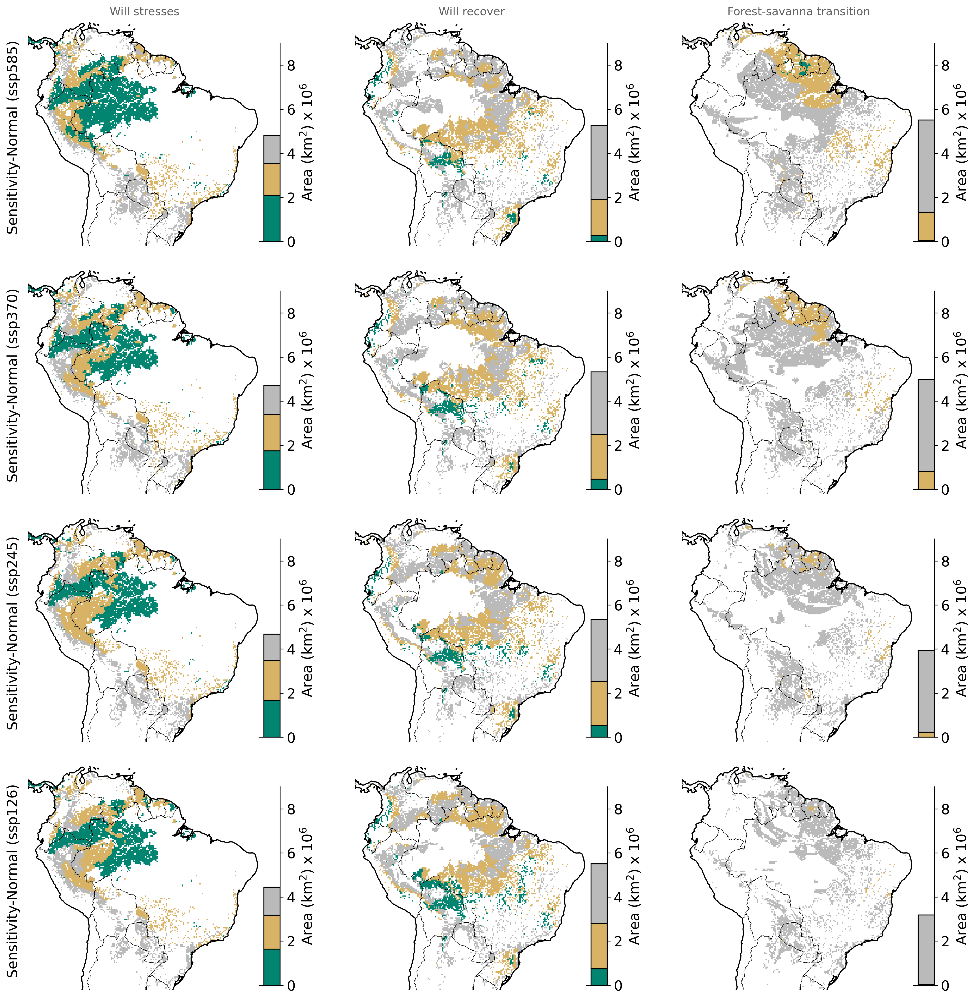

In [72]:
fig = plt.figure(figsize=(16.5,18), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']: 
    ax[i].text(-86, -30.0, 'Sensitivity-Normal ('+SSP+')', ha='center', fontsize = 15, color = 'black', zorder = 50, rotation  = 90);    
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom(SA_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, lat_min, lat_max, lon_min, lon_max,ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom(SA_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, lat_min, lat_max, lon_min, lon_max,ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom(SA_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, lat_min, lat_max, lon_min, lon_max,ax = axs)
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.1)

ax[0].set_title('Will stresses', fontsize = '12', color = '#636363');
ax[1].set_title('Will recover', fontsize = '12', color = '#636363');
ax[2].set_title('Forest-savanna transition', fontsize = '12', color = '#636363');


#### Running analysis

In [73]:
# For Africa
AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max = [-35,15,0,55]
if (AF_lon_min == 0) & (AF_lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'
AF_Sr_lower_threshold = 100
AF_Sr_upper_threshold = 350

Africa (Total Area) = 5611461.72376163 km^2

In [75]:
df_final = pd.read_csv(parent_dir+'/CMIP6-Future_models_all_(with Sr-eq)_Africa.csv')

In [76]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,121.113881,310.662721
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,206.084287,295.555795
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,121.608941,354.318473
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,67.826050,134.381436
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,49.693557,220.267113
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,129.916378,316.431578
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,110.769568,204.207156
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,122.625083,203.495422
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,258.612941,422.435308
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,110.789278,217.853644


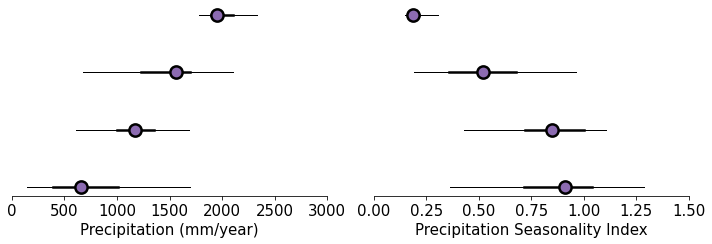

In [77]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
dataframe_sav = savanna_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= AF_Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > AF_Sr_lower_threshold) & (dataframe_forest['Sr'] < AF_Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,3000)
ax[1].set_xlim(0,1.5)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

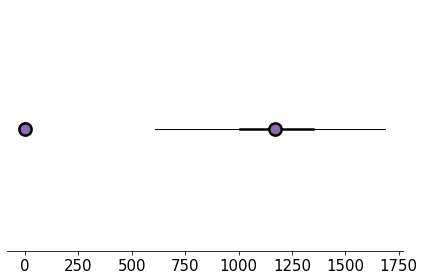

In [78]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))

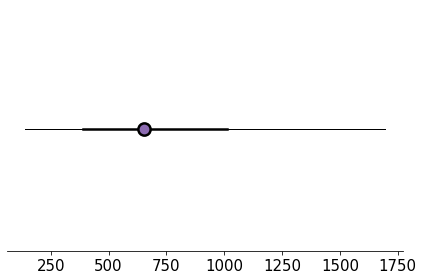

In [79]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [80]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [81]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [82]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

---

In [84]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))

        for class_number in range(1,10):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:03<00:00,  9.28it/s]


In [86]:
#Interesting trends-4,5,15,22

AF_CMIP6_class_all_forest_savanna_corrected = {}
AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(parent_dir+'/Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        
        b = 0
        b = (Forest_savanna_transition_low_sensitivity(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[SSP+'.'+str(a_temp.iloc[i,1])] = b

        c = 0
        c = (Forest_savanna_transition_high_sensitivity(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[SSP+'.'+str(a_temp.iloc[i,1])] = c
        
        future_year_end = 2100

100%|██████████| 30/30 [12:36<00:00, 25.21s/it]


In [87]:
save_folder = 'AF_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [88]:
#Saving Sr under different scenarios
common_dir = ['Saved_NetCDF/'+save_folder]
for dir2 in common_dir:
    try: os.makedirs(os.path.join(parent_dir,dir2))
    except OSError: pass

In [89]:
for name in tqdm(AF_CMIP6_class_all_forest_savanna_corrected.keys()):
    AF_CMIP6_class_all_forest_savanna_corrected[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 203.07it/s]


In [90]:
for name in tqdm(AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity.keys()):
    AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 206.32it/s]


In [91]:
for name in tqdm(AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity.keys()):
    AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name].to_netcdf(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High'+'.nc')

100%|██████████| 113/113 [00:00<00:00, 195.75it/s]


---

In [92]:
save_folder = 'AF_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [93]:
AF_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 260.70it/s]


In [94]:
AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 261.66it/s]


In [95]:
AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 258.92it/s]


In [97]:
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

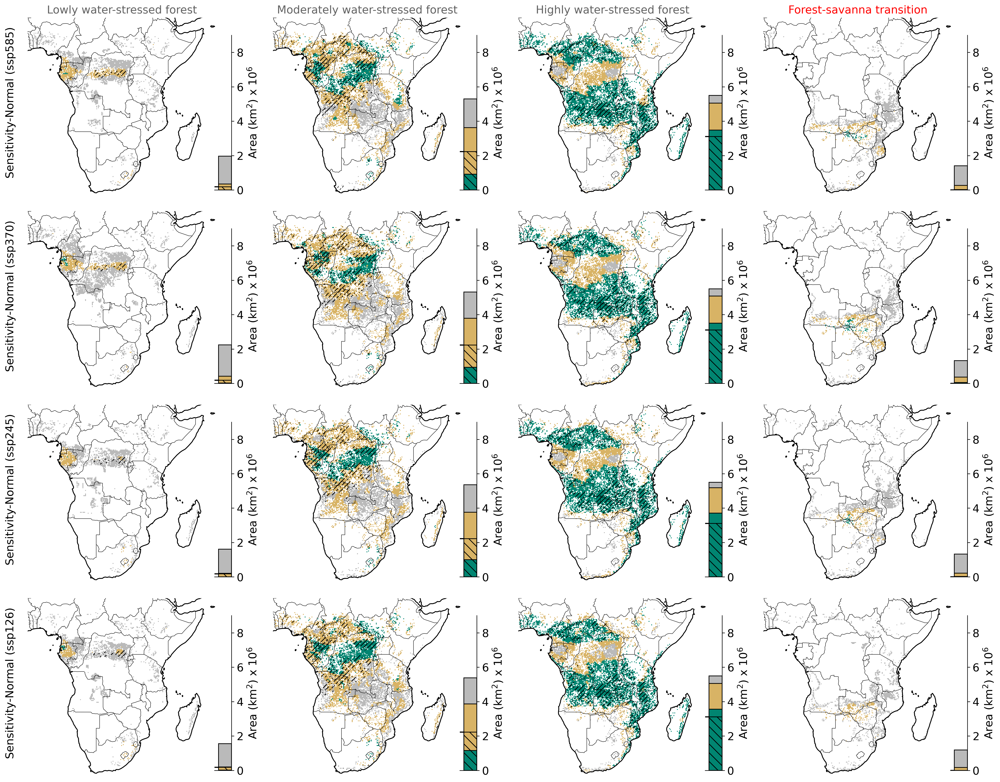

In [98]:
fig = plt.figure(figsize=(22,18), dpi = 300)
ax = [plt.subplot(441,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(442,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(443,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(444,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(445,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(446,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(447,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(448,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(449,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,12,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(4,4,13,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,14,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,15,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,4,16,projection=ccrs.PlateCarree(), aspect='auto')]

for i in [0,4,8,12]:
    ax[i+0].contourf(Sr_contour.where(Sr <= AF_Sr_lower_threshold).lon.values, Sr_contour.where(Sr <= AF_Sr_lower_threshold).lat.values, (Sr_contour.where(Sr <= AF_Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lon.values, Sr_contour.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lat.values, Sr_contour.where((Sr> AF_Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour.where(Sr > AF_Sr_upper_threshold).lon.values, Sr_contour.where(Sr > AF_Sr_upper_threshold).lat.values, (Sr_contour.where(Sr > AF_Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['////'], transform=cartopy.crs.PlateCarree(), zorder = 10)

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    ax[i].text(-5, -30.0, 'Sensitivity-Normal ('+SSP+')', ha='center', fontsize = 15, color = 'black', zorder = 50, rotation  = 90);
    for Forest_class,j in zip(['LWSf','MWSf','HWSf','Tipping'],[0,1,2,3]):
        combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = ['#bababa','#d8b365','#018571'])

        ax[i+j].coastlines(lw = 1.2)
        ax[i+j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
        fig.patch.set_visible(False)
        ax[i+j].axis('off')
        axs = inset_axes(ax[i+j], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes(AF_CMIP6_class_all_forest_savanna_corrected, SSP,Forest_class, AF_Sr_lower_threshold, AF_Sr_upper_threshold, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs)
    i = i+j+1 

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = '#636363');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = '#636363');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = '#636363');
ax[3].set_title('Forest-savanna transition', fontsize = '15', color = '#ff0000');

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.1)


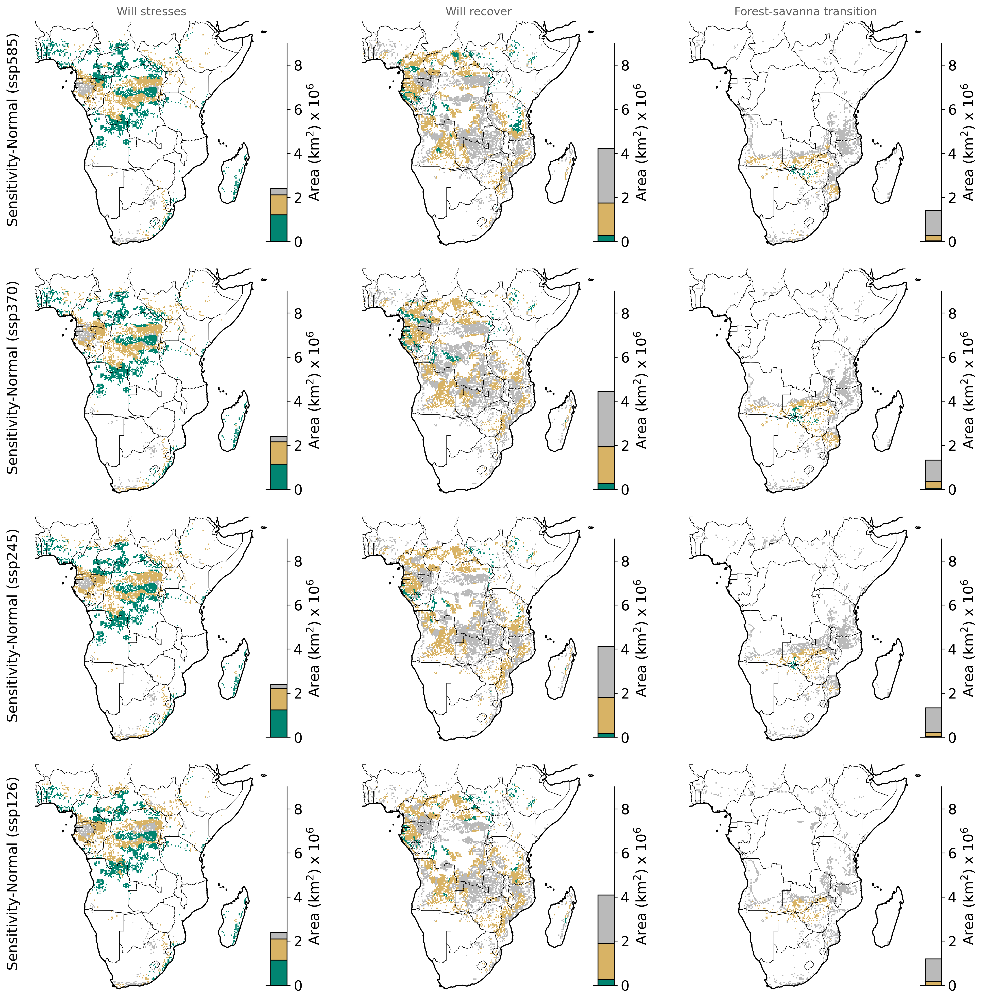

In [99]:
fig = plt.figure(figsize=(16.5,18), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']: 
    ax[i].text(-5, -30.0, 'Sensitivity-Normal ('+SSP+')', ha='center', fontsize = 15, color = 'black', zorder = 50, rotation  = 90);    
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom(AF_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6,  AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom(AF_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8,  AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = ['#bababa','#d8b365','#018571'],ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="9%", height="40%", loc='lower right', bbox_to_anchor=(0.1,0,1,2.2), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom(AF_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13,  AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs)
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.1)

ax[0].set_title('Will stresses', fontsize = '12', color = '#636363');
ax[1].set_title('Will recover', fontsize = '12', color = '#636363');
ax[2].set_title('Forest-savanna transition', fontsize = '12', color = '#636363');


## --------------------------------------------------------------------------------------------------------------------------------------------------------------------------